In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# sklearn packages
from sklearn import preprocessing
from sklearn.impute import SimpleImputer
# from sklearn.impute import KNNImputer

# from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error

# from sklearn.decomposition import PCA
# from sklearn.svm import SVR
# from sklearn.neural_network import MLPRegressor
# from sklearn.ensemble import RandomForestRegressor
# from sklearn.kernel_ridge import KernelRidge
from sklearn.linear_model import LinearRegression


In [3]:
fileNames=['rawDataFull1001.csv', 'rawDataFull1003.csv', 
            'rawDataFull1004.csv', 'rawDataFull1005.csv',
            'rawDataFull1006.csv']
path='../ITC RUSAL/baths_v2/'
bathNumber=['1001','1003','1004','1005','1006']

# data[0] - 1001, 1 - 1003, 2 - 1004, 3 - 1005, 4 - 1006
data=[]
for dataset in fileNames:
    data.append(pd.read_csv(path+dataset))

# удалить столбец "KOL4", т.к. он пустой по всех 5ти наборах
for i in range(5):
    data[i]=data[i].drop(columns=['KOL4'])

fullNames=['АЭ: длит. <Сред.>', 'АЭ: кол-во <Сред.>', 'АЭ: напр. ср.м. <Сред.>(В)',
            'Время в недопитке <Сред.> (час)', 'Время в номинале <Сред.> (час)',
            'Время  в перепитке <Сред.> (час)', 'Время в тесте <Сред.> (час)', 
            'Время на голод. <Сред.> (час)', 'Кол-во доз АПГ в недопитке <Сумма> (шт.)',
            'Кол-во доз АПГ в номинале <Сумма> (шт.)', 'Кол-во доз АПГ в перепитке <Сумма> (шт.)',
            'Кол-во доз АПГ в тесте <Сумма> (шт.)', 'Напр. зад. <Сред.> (В)', 'Напр. эл-ра <Сред.> (В)',
            'Настыль: длина <Сред.> (см)', 'Подина: состояние <Сред.> (оц.)', 
            'РМПР: длит. ВИРА <Сред.> (сек)', 'РМПР: длит. МАЙНА <Сред.> (сек)', 
            'РМПР: коэфф. <Сред.>', 'РМПР: кол-во ВИРА <Сред.> (шт)', 'РМПР: кол-во МАЙНА <Сред.> (шт)',
            'Эл-лит: темп-ра <Сред.> (°C)', 'Металл: уровень <Сред.> (см)', 'Эл-лит: уровень <Сред.> (см)', 
            'Шум <Сред.> (В)', 'Эл-лит: CaF2 <Сред.> (%)', 'Эл-лит: КО <Сред.>', 'AlF3: добавка <Сред.> (кг)',
            'Напр. анода <Сред.> (В)' ]
fullNames_2=['Выход на в.сутки: Кр/весы <Сред.> (кг)', 'Выход на в.сутки: Л/О <Сред.> (кг)',
            'Выход на в.сутки: по заданию <Сред.> (кг)', 'Выход по току: Л/О <Сред.> (%)',
            'Ток серии (АСУТП) <Сред.> (кА)']

fullNames.remove('Кол-во доз АПГ в тесте <Сумма> (шт.)')
fullNamesInRussian=fullNames+fullNames_2
paramNames=data[0].columns.to_list()


In [4]:
# normalize into [0,1]
dataScaled=[]
for i in range(5):
    x=data[i].values
    scaler = preprocessing.MinMaxScaler()
    x_scaled = scaler.fit_transform(x)
    dataScaled.append( pd.DataFrame(x_scaled, columns=data[i].columns.values) )


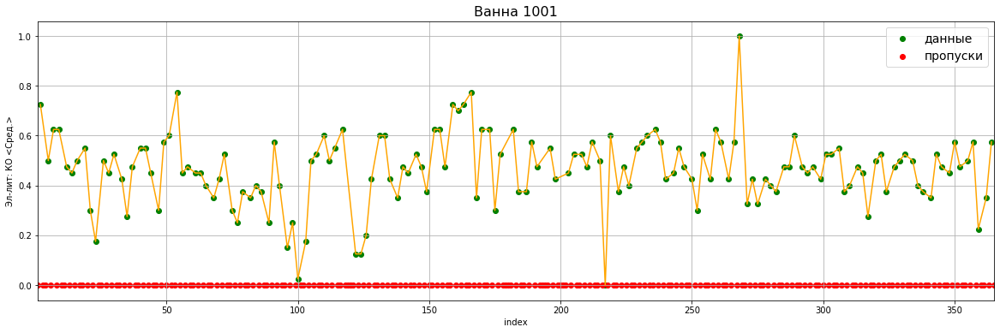

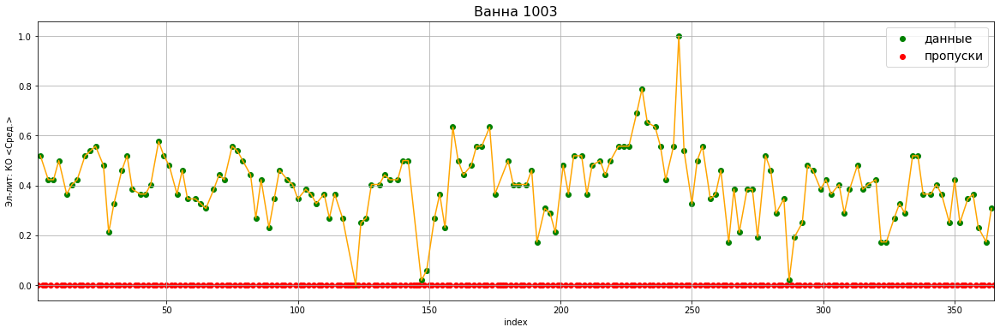

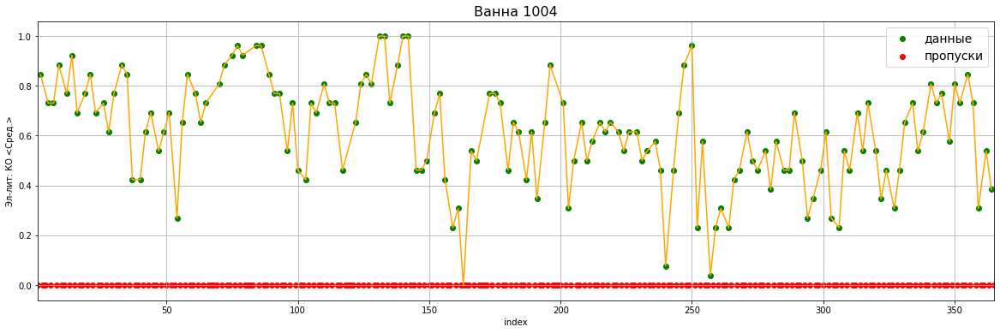

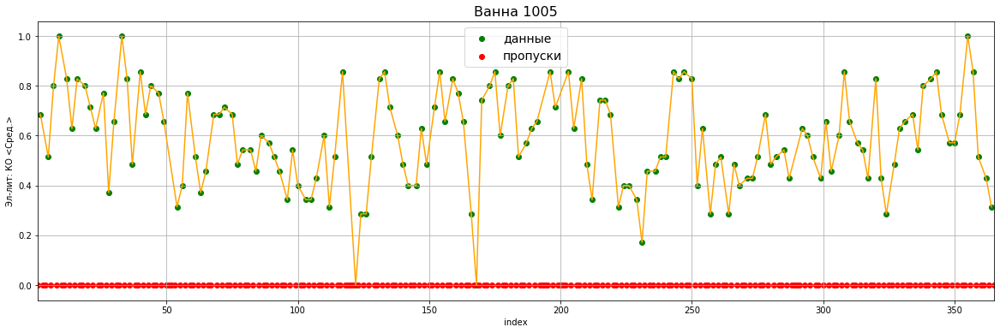

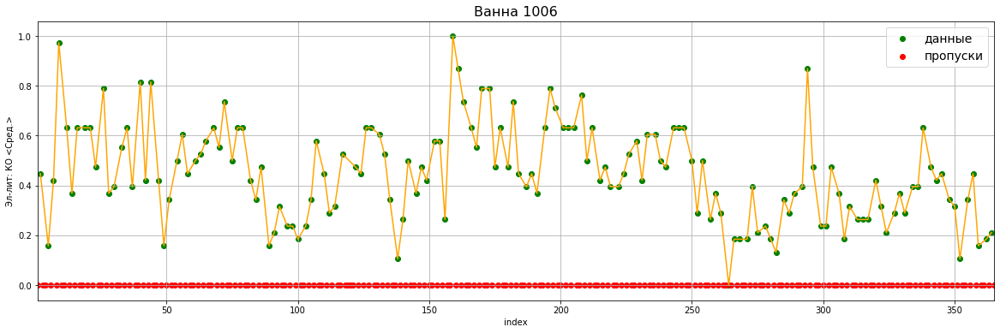

In [5]:
# plot all data as is
for i in range(5):
    fig, ax = plt.subplots(figsize=(20,6))
    x1=dataScaled[i]['EKO'][dataScaled[i]['EKO'].notna()].index+1
    y1=dataScaled[i]['EKO'][dataScaled[i]['EKO'].notna()].values
    x2=dataScaled[i]['EKO'][dataScaled[i]['EKO'].isna()].index+1
    y2=np.zeros(len(x2))
    ax.scatter(x1, y1, color='green', marker='o', label='данные')
    ax.scatter(x2, y2, color='red', marker='o', label='пропуски')
    ax.plot(x1, y1, color='orange')
    ax.set_xlabel('index')
    ax.set_ylabel(fullNamesInRussian[paramNames.index('EKO')])
    ax.grid(axis = 'both')
    ax.set_xlim(1,365)
    ax.legend(fontsize=14)
    
    ax.set_title('Ванна '+bathNumber[i], fontsize=16)
    # plt.savefig('path\name.png', dpi=300, bbox_inches='tight')
    plt.show()


In [6]:
# replace nan with mean 
dataScImpMean=[]
for i in range(5):
    impMean = SimpleImputer(missing_values=np.nan, strategy='mean')
    dataScImpMean.append( pd.DataFrame(impMean.fit_transform(dataScaled[i]), 
                            columns=dataScaled[i].columns.values) )


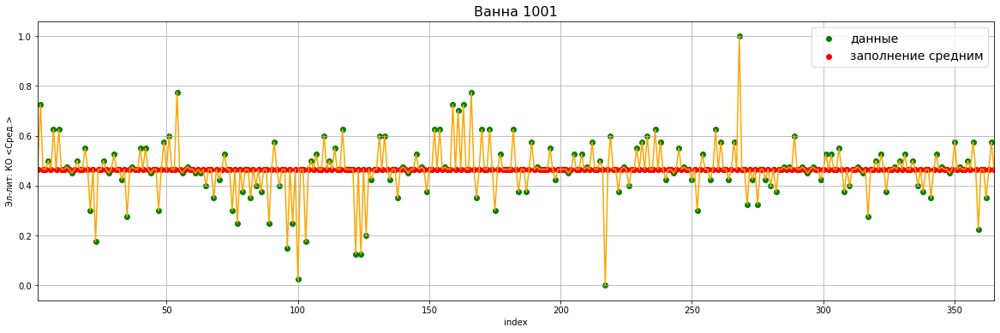

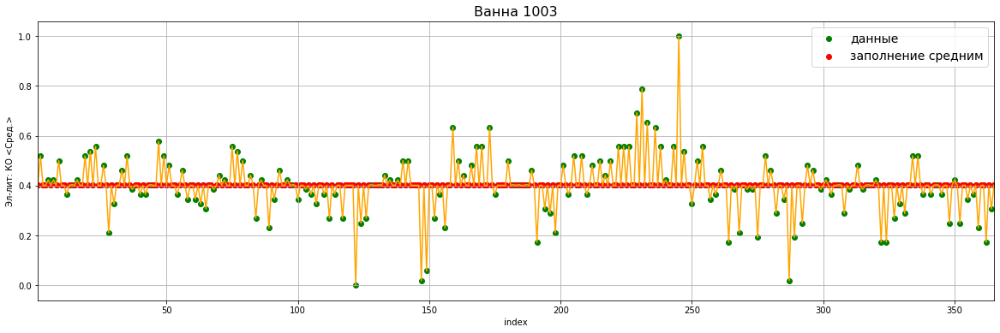

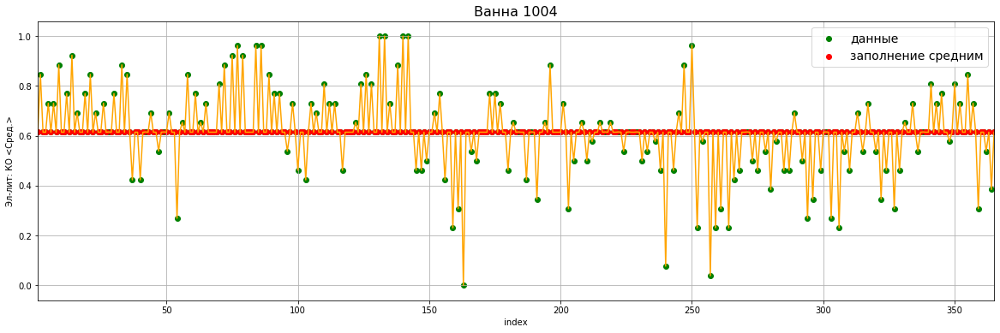

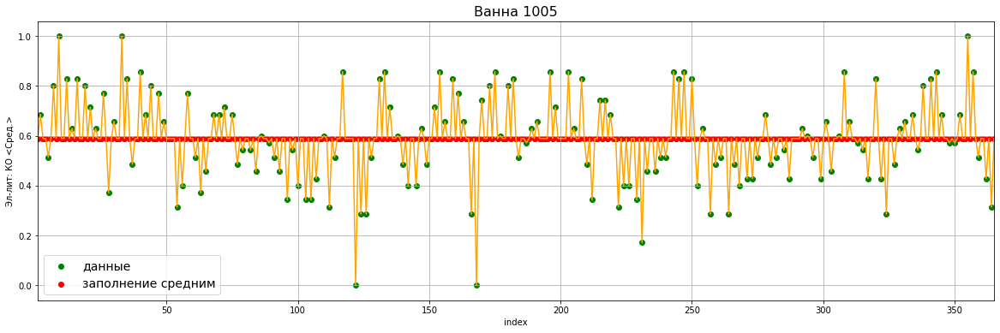

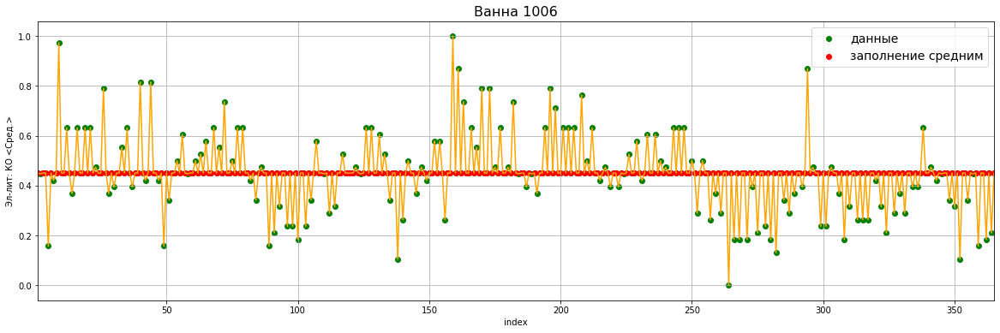

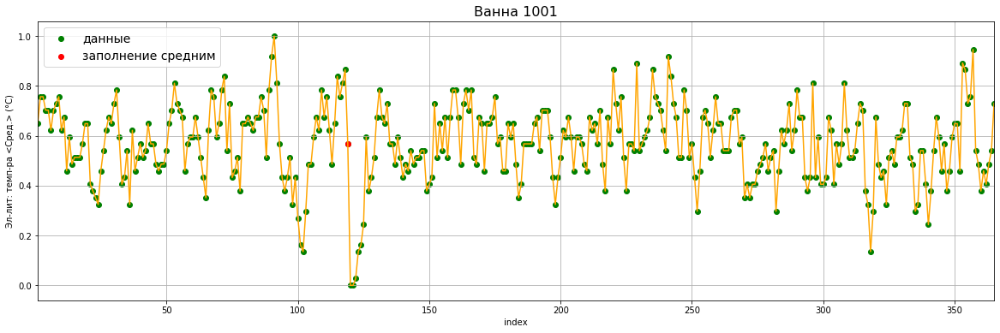

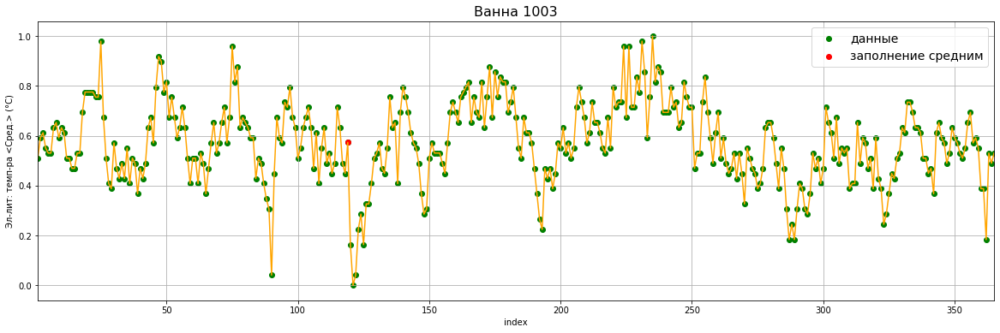

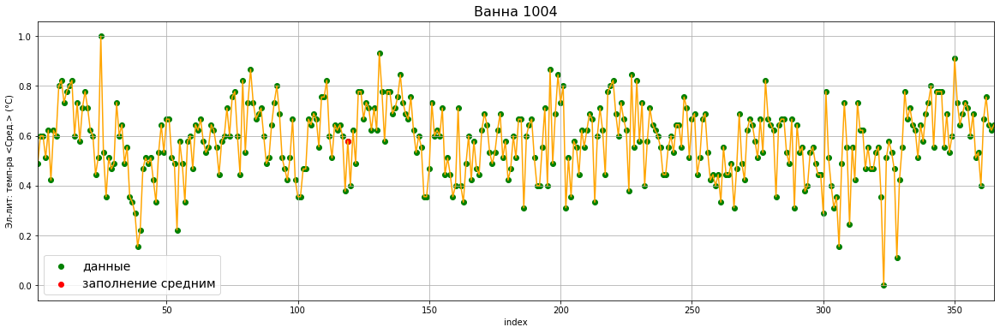

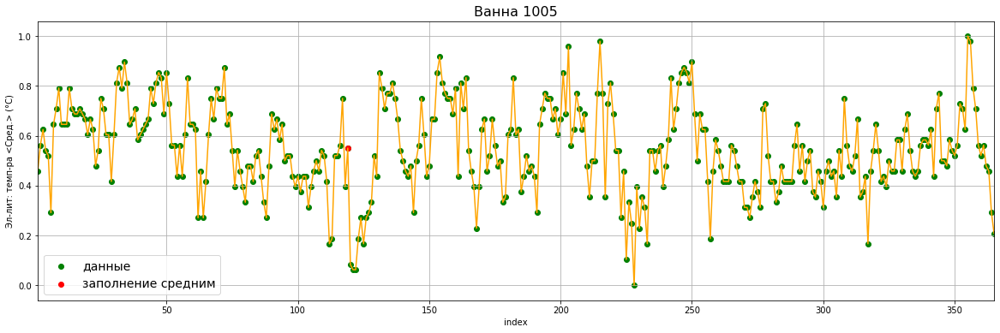

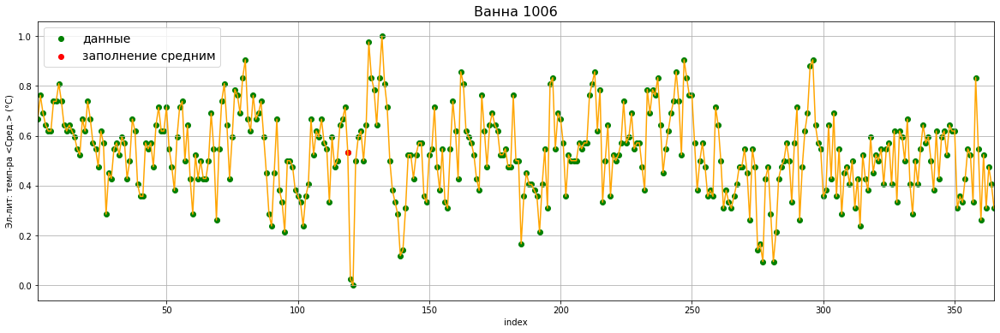

In [7]:
# plot all data with mean
for i in range(5):
    fig, ax = plt.subplots(figsize=(20,6))
    
    x1=dataScImpMean[i]['EKO'].index+1
    y1=dataScImpMean[i]['EKO'].values
    ax.scatter(x1, y1, color='green', marker='o', label='данные')
    
    x2=dataScaled[i]['EKO'][dataScaled[i]['EKO'].isna()].index+1
    y2=dataScImpMean[i]['EKO'][dataScaled[i]['EKO'].isna()].values
    ax.scatter(x2, y2, color='red', marker='o', label='заполнение средним')    
    
    ax.plot(x1, y1, color='orange')
    ax.set_xlabel('index')
    ax.set_ylabel(fullNamesInRussian[paramNames.index('EKO')])
    ax.grid(axis = 'both')
    ax.set_xlim(1,365)
    ax.legend(fontsize=14)
    
    ax.set_title('Ванна '+bathNumber[i], fontsize=16)
    # plt.savefig('path\name.png', dpi=300, bbox_inches='tight')
    plt.show()

for i in range(5):
    fig, ax = plt.subplots(figsize=(20,6))
    
    x1=dataScImpMean[i]['ETEMP'].index+1
    y1=dataScImpMean[i]['ETEMP'].values
    ax.scatter(x1, y1, color='green', marker='o', label='данные')
    
    x2=dataScaled[i]['ETEMP'][dataScaled[i]['ETEMP'].isna()].index+1
    y2=dataScImpMean[i]['ETEMP'][dataScaled[i]['ETEMP'].isna()].values
    ax.scatter(x2, y2, color='red', marker='o', label='заполнение средним')    
    
    ax.plot(x1, y1, color='orange')
    ax.set_xlabel('index')
    ax.set_ylabel(fullNamesInRussian[paramNames.index('ETEMP')])
    ax.grid(axis = 'both')
    ax.set_xlim(1,365)
    ax.legend(fontsize=14)
    
    ax.set_title('Ванна '+bathNumber[i], fontsize=16)
    # plt.savefig('path\name.png', dpi=300, bbox_inches='tight')
    plt.show()


In [8]:
# time series-like fill
dataScImpInterpolate=[]
for i in range(5):
    dataScImpInterpolate.append(dataScaled[i].copy())

for i in range(5):
    
    totalNum=dataScImpInterpolate[i]['NAST'].value_counts().iat[0]+dataScImpInterpolate[i]['NAST'].value_counts().iat[1]
    total0=dataScImpInterpolate[i]['NAST'].value_counts().iat[0]
    total1=dataScImpInterpolate[i]['NAST'].value_counts().iat[1]
    p0=total0/totalNum
    p1=total1/totalNum

    for j in range(365):
            # заполнить в соответсвии с распределением
            if np.isnan(dataScImpInterpolate[i]['NAST'].iat[j]):
                if np.random.rand()<=p0:
                    dataScImpInterpolate[i]['NAST'].iat[j]=0.0
                else:
                    dataScImpInterpolate[i]['NAST'].iat[j]=1.0
            # заполнить наиболее встречающимся значением
            if np.isnan(dataScImpInterpolate[i]['POD'].iat[j]):
                dataScImpInterpolate[i]['POD'].iat[j]=0.0
    
    for k in dataScImpInterpolate[i].columns:
        if dataScImpInterpolate[i][k].count()<365:
            if np.isnan(dataScImpInterpolate[i][k].iat[0])==True:
                # для интерполяции нужно первое значение в массиве
                dataScImpInterpolate[i][k].iat[0]=dataScImpInterpolate[i][k].median()
            dataScImpInterpolate[i][k] = dataScImpInterpolate[i][k].interpolate(method='linear').copy()    


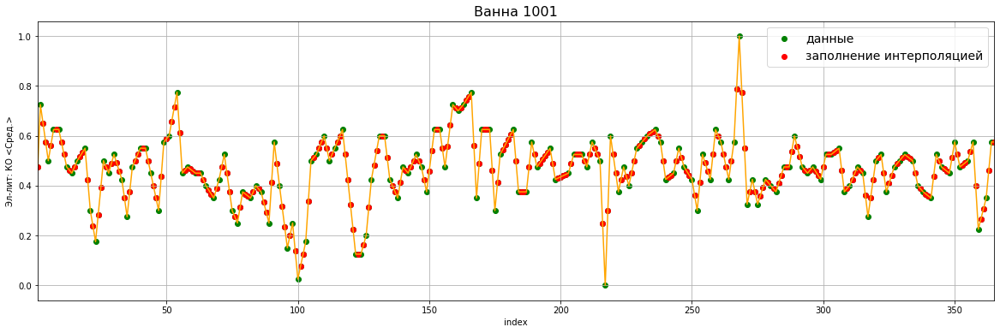

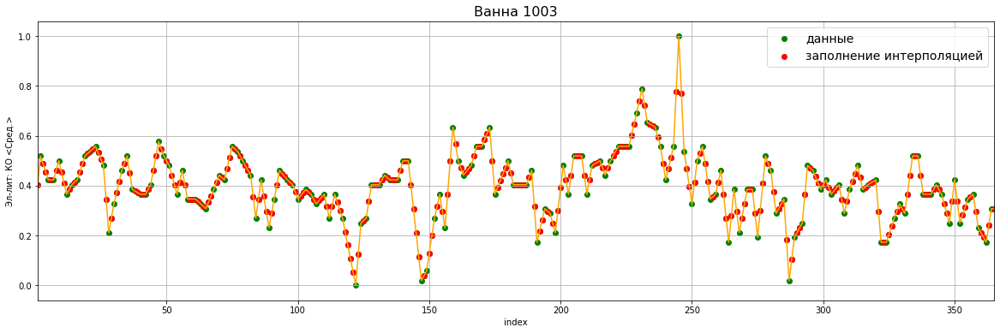

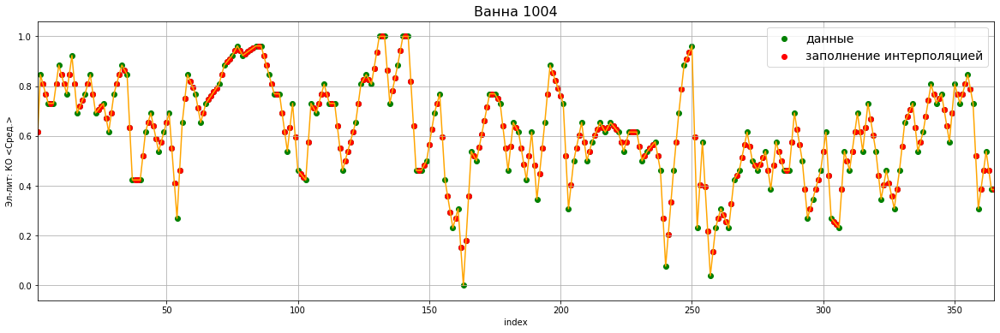

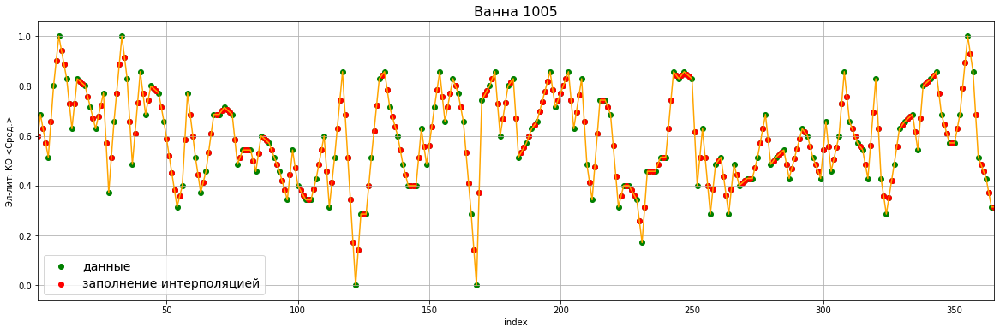

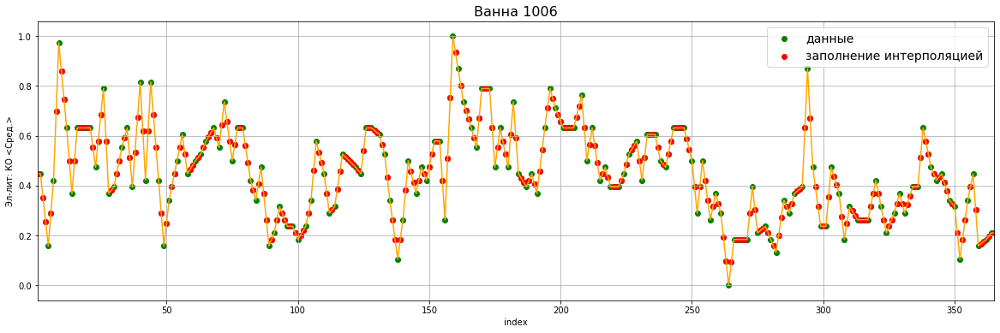

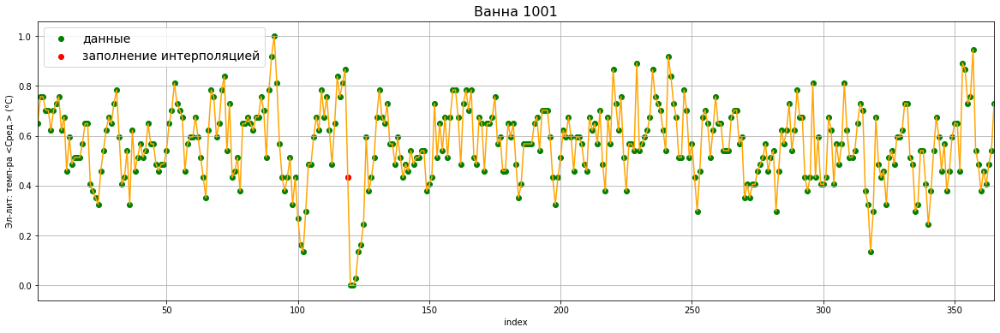

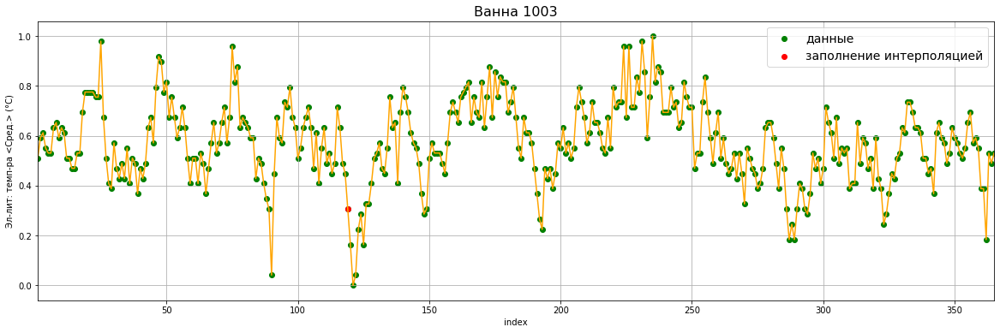

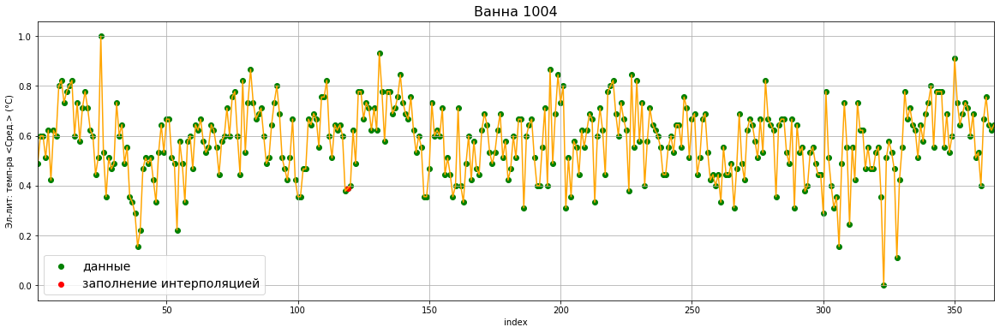

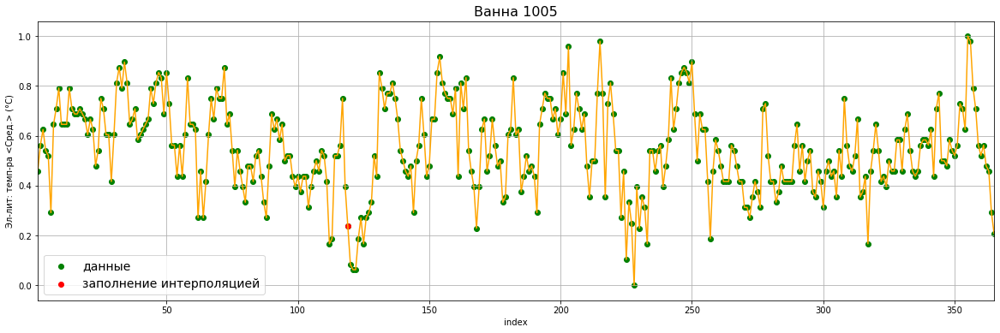

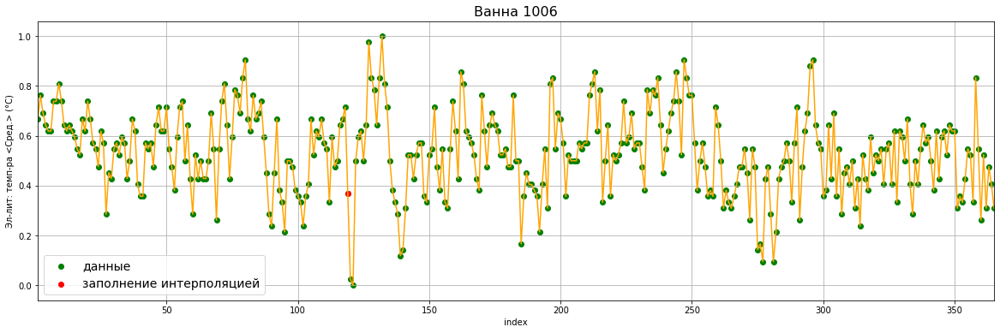

In [9]:
# plot all data with mean
for i in range(5):
    fig, ax = plt.subplots(figsize=(20,6))
    
    x1=dataScImpInterpolate[i]['EKO'].index+1
    y1=dataScImpInterpolate[i]['EKO'].values
    ax.scatter(x1, y1, color='green', marker='o', label='данные')
    
    x2=dataScImpInterpolate[i]['EKO'][dataScaled[i]['EKO'].isna()].index+1
    y2=dataScImpInterpolate[i]['EKO'][dataScaled[i]['EKO'].isna()].values
    ax.scatter(x2, y2, color='red', marker='o', label='заполнение интерполяцией')    
    
    ax.plot(x1, y1, color='orange')
    ax.set_xlabel('index')
    ax.set_ylabel(fullNamesInRussian[paramNames.index('EKO')])
    ax.grid(axis = 'both')
    ax.set_xlim(1,365)
    ax.legend(fontsize=14)
    
    ax.set_title('Ванна '+bathNumber[i], fontsize=16)
    # plt.savefig('path\name.png', dpi=300, bbox_inches='tight')
    plt.show()

for i in range(5):
    fig, ax = plt.subplots(figsize=(20,6))
    
    x1=dataScImpInterpolate[i]['ETEMP'].index+1
    y1=dataScImpInterpolate[i]['ETEMP'].values
    ax.scatter(x1, y1, color='green', marker='o', label='данные')
    
    x2=dataScImpInterpolate[i]['ETEMP'][dataScaled[i]['ETEMP'].isna()].index+1
    y2=dataScImpInterpolate[i]['ETEMP'][dataScaled[i]['ETEMP'].isna()].values
    ax.scatter(x2, y2, color='red', marker='o', label='заполнение интерполяцией')    
    
    ax.plot(x1, y1, color='orange')
    ax.set_xlabel('index')
    ax.set_ylabel(fullNamesInRussian[paramNames.index('ETEMP')])
    ax.grid(axis = 'both')
    ax.set_xlim(1,365)
    ax.legend(fontsize=14)
    
    ax.set_title('Ванна '+bathNumber[i], fontsize=16)
    # plt.savefig('path\name.png', dpi=300, bbox_inches='tight')
    plt.show()


In [10]:
# linear regression EKO
modelLinearMeanEKO=[None]*5
rmseLinearMeanEKO=[None]*5
maeLinearMeanEKO=[None]*5
r2scoreLinearMeanEKO=[None]*5
predictedImpMeanEKO=[None]*5

modelLinearInterpEKO=[None]*5
rmseLinearInterpEKO=[None]*5
maeLinearInterpEKO=[None]*5
r2scoreLinearInterpEKO=[None]*5
predictedImpInterpEKO=[None]*5

for i in range(5):

    inputs=dataScImpMean[i].copy().drop(columns=['EKO', 'ETEMP'])
    targetsEKO=dataScImpMean[i]['EKO'].copy()
    modelLinearMeanEKO[i] = LinearRegression()
    modelLinearMeanEKO[i].fit(inputs, targetsEKO)
    predictedImpMeanEKO[i] = modelLinearMeanEKO[i].predict(inputs)
    
    rmseLinearMeanEKO[i] = mean_squared_error(targetsEKO, predictedImpMeanEKO[i], squared=False)
    r2scoreLinearMeanEKO[i] = r2_score(targetsEKO, predictedImpMeanEKO[i])   
    maeLinearMeanEKO[i]=mean_absolute_error(targetsEKO, predictedImpMeanEKO[i])

    inputs=dataScImpInterpolate [i].copy().drop(columns=['EKO', 'ETEMP'])
    targetsEKO=dataScImpInterpolate[i]['EKO'].copy()
    modelLinearInterpEKO[i] = LinearRegression()
    modelLinearInterpEKO[i].fit(inputs, targetsEKO)
    predictedImpInterpEKO[i] = modelLinearInterpEKO[i].predict(inputs)
    
    rmseLinearInterpEKO[i] = mean_squared_error(targetsEKO, predictedImpInterpEKO[i], squared=False)
    r2scoreLinearInterpEKO[i] = r2_score(targetsEKO, predictedImpInterpEKO[i])
    maeLinearInterpEKO[i]=mean_absolute_error(targetsEKO, predictedImpInterpEKO[i])


In [11]:
# linear regression ETEMP
modelLinearMeanETEMP=[None]*5
rmseLinearMeanETEMP=[None]*5
maeLinearMeanETEMP=[None]*5
r2scoreLinearMeanETEMP=[None]*5
predictedImpMeanETEMP=[None]*5

modelLinearInterpETEMP=[None]*5
rmseLinearInterpETEMP=[None]*5
maeLinearInterpETEMP=[None]*5
r2scoreLinearInterpETEMP=[None]*5
predictedImpInterpETEMP=[None]*5

for i in range(5):

    inputs=dataScImpMean[i].copy().drop(columns=['ETEMP', 'ETEMP'])
    targetsETEMP=dataScImpMean[i]['ETEMP'].copy()
    modelLinearMeanETEMP[i] = LinearRegression()
    modelLinearMeanETEMP[i].fit(inputs, targetsETEMP)
    predictedImpMeanETEMP[i] = modelLinearMeanETEMP[i].predict(inputs)
    
    rmseLinearMeanETEMP[i] = mean_squared_error(targetsETEMP, predictedImpMeanETEMP[i], squared=False)
    r2scoreLinearMeanETEMP[i] = r2_score(targetsETEMP, predictedImpMeanETEMP[i])   
    maeLinearMeanETEMP[i]=mean_absolute_error(targetsETEMP, predictedImpMeanETEMP[i])

    inputs=dataScImpInterpolate [i].copy().drop(columns=['ETEMP', 'ETEMP'])
    targetsETEMP=dataScImpInterpolate[i]['ETEMP'].copy()
    modelLinearInterpETEMP[i] = LinearRegression()
    modelLinearInterpETEMP[i].fit(inputs, targetsETEMP)
    predictedImpInterpETEMP[i] = modelLinearInterpETEMP[i].predict(inputs)
    
    rmseLinearInterpETEMP[i] = mean_squared_error(targetsETEMP, predictedImpInterpETEMP[i], squared=False)
    r2scoreLinearInterpETEMP[i] = r2_score(targetsETEMP, predictedImpInterpETEMP[i])
    maeLinearInterpETEMP[i]=mean_absolute_error(targetsETEMP, predictedImpInterpETEMP[i])



In [12]:
rezultLinearRegressionEKO=pd.DataFrame(
    {
        'RMSE_mean': rmseLinearMeanEKO, 'R2_mean': r2scoreLinearMeanEKO,
        'MAE_mean': maeLinearMeanEKO,
        'RMSE_interp': rmseLinearInterpEKO, 'R2_interp': r2scoreLinearInterpEKO,
        'MAE_interp': maeLinearInterpEKO
    }, 
    index=['1001','1003','1004','1005','1006'])
rezultLinearRegressionEKO


,RMSE_mean,R2_mean,MAE_mean,RMSE_interp,R2_interp,MAE_interp
1001,0.083559,0.152211,0.051114,0.102573,0.330253,0.075634
1003,0.074823,0.297668,0.050679,0.087535,0.531556,0.065711
1004,0.115569,0.254732,0.081893,0.140208,0.482568,0.110360
1005,0.108709,0.228784,0.077921,0.121252,0.519102,0.096967
1006,0.108584,0.221010,0.075370,0.133579,0.421998,0.105231


In [13]:
rezultLinearRegressionETEMP=pd.DataFrame(
    {
        'RMSE_mean': rmseLinearMeanETEMP, 'R2_mean': r2scoreLinearMeanETEMP,
        'MAE_mean': maeLinearMeanETEMP,
        'RMSE_interp': rmseLinearInterpETEMP, 'R2_interp': r2scoreLinearInterpETEMP,
        'MAE_interp': maeLinearInterpETEMP
    }, 
    index=['1001','1003','1004','1005','1006'])
rezultLinearRegressionETEMP


,RMSE_mean,R2_mean,MAE_mean,RMSE_interp,R2_interp,MAE_interp
1001,0.105310,0.531808,0.083409,0.098234,0.593487,0.078138
1003,0.090888,0.683057,0.072405,0.083733,0.732998,0.067044
1004,0.105278,0.473101,0.081820,0.102811,0.499861,0.080137
1005,0.099845,0.680882,0.077590,0.093821,0.720585,0.074296
1006,0.106011,0.592178,0.084887,0.101240,0.629050,0.080205


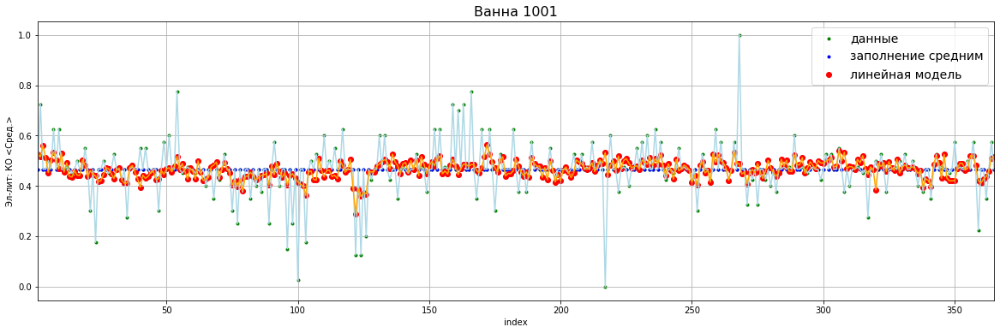

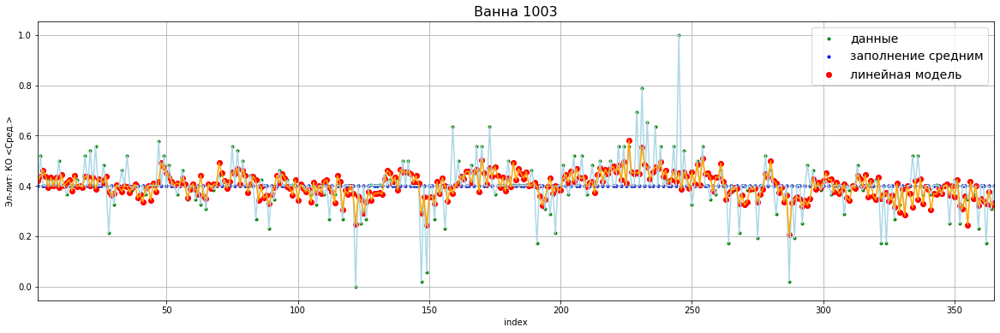

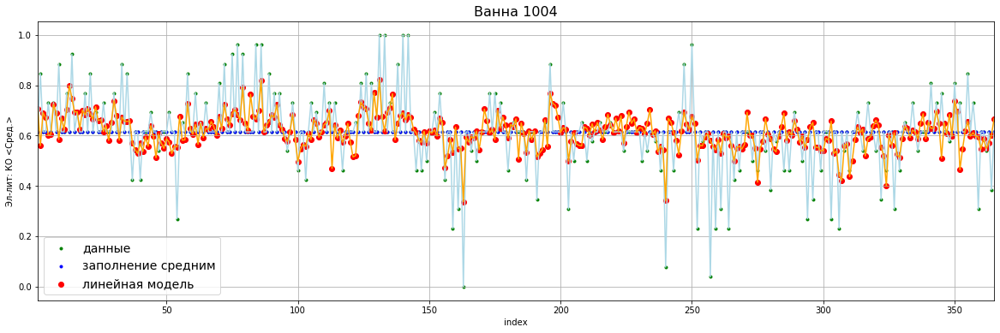

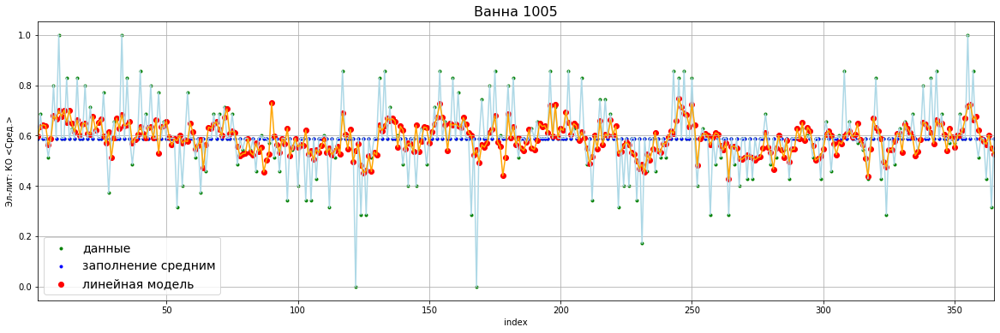

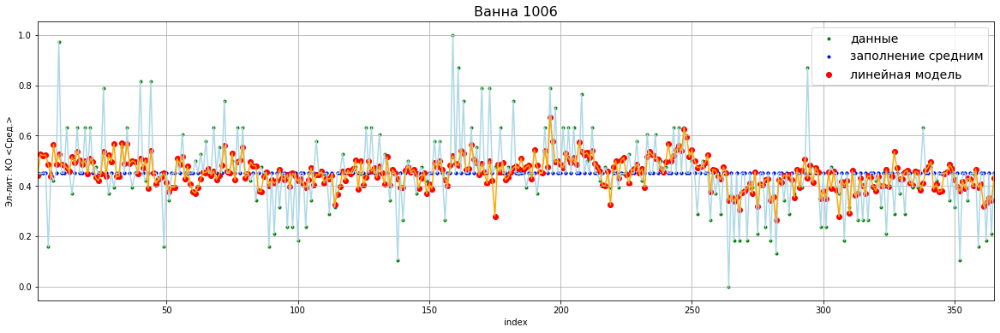

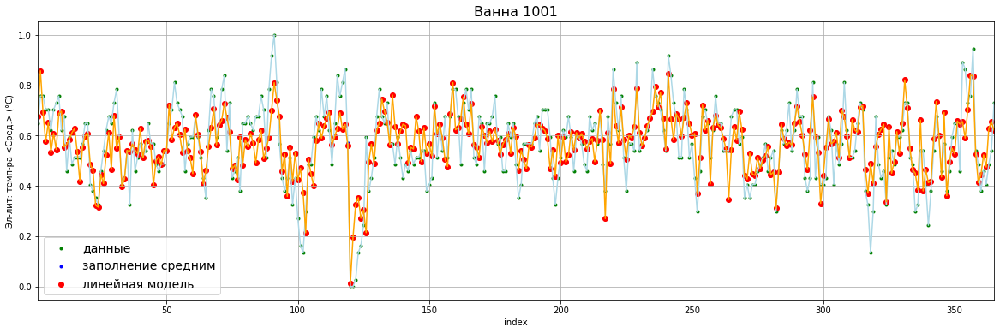

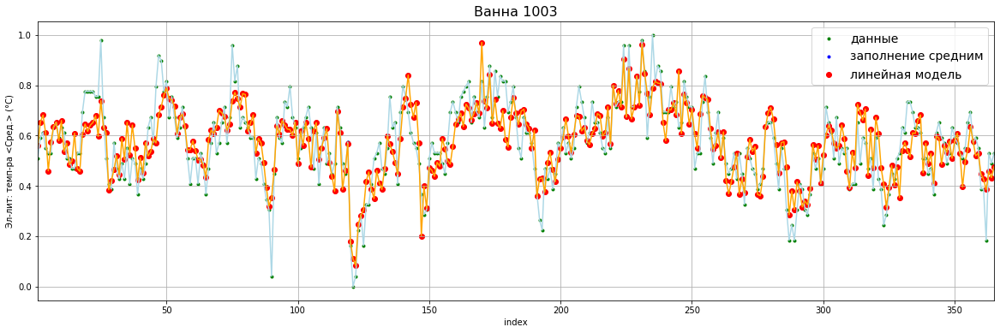

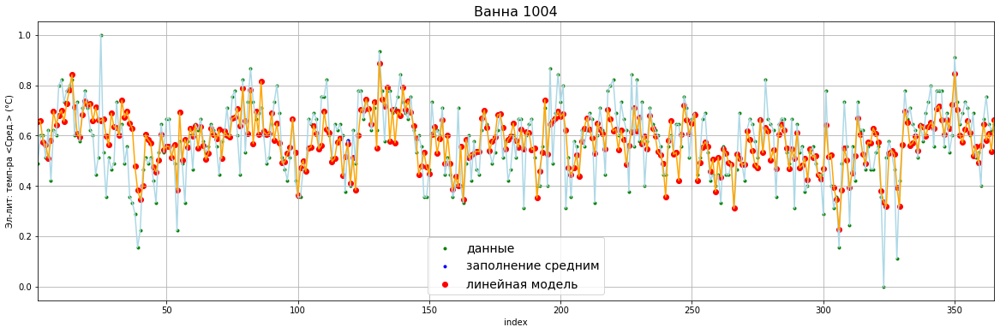

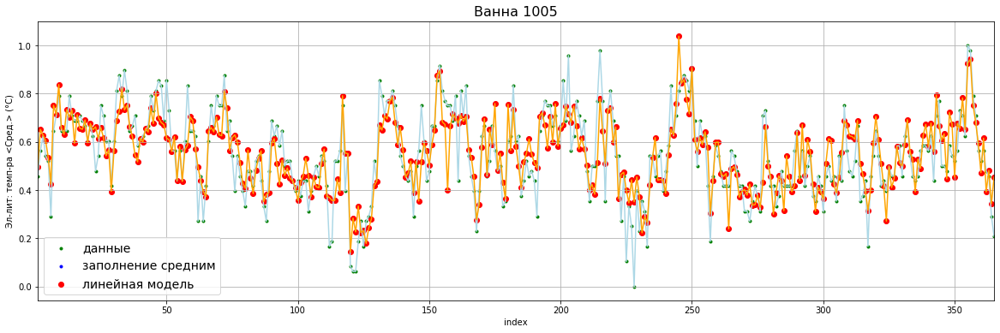

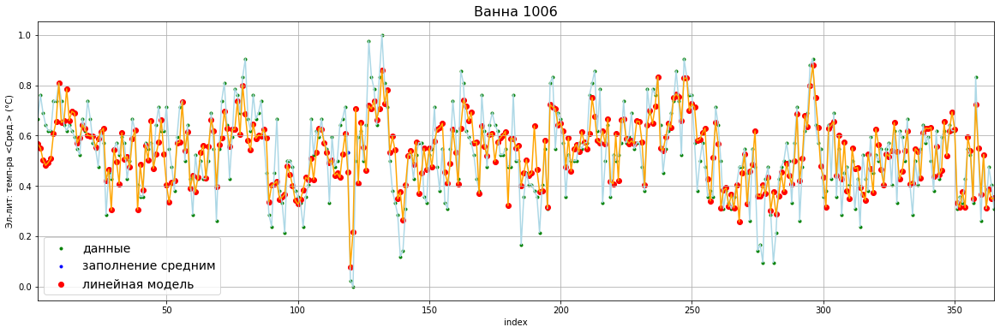

In [14]:
# plot all data and linear regression with mean
for i in range(5):
    fig, ax = plt.subplots(figsize=(20,6))
    
    x1=dataScImpMean[i]['EKO'].index+1
    y1=dataScImpMean[i]['EKO'].values
    ax.scatter(x1, y1, color='green', marker='.', label='данные')
    
    x2=dataScaled[i]['EKO'][dataScaled[i]['EKO'].isna()].index+1
    y2=dataScImpMean[i]['EKO'][dataScaled[i]['EKO'].isna()].values
    ax.scatter(x2, y2, color='blue', marker='.', label='заполнение средним')    

    x3=dataScImpMean[i]['EKO'].index+1
    y3=predictedImpMeanEKO[i]
    ax.scatter(x3, y3, color='red', marker='o', label='линейная модель')    

    ax.plot(x1, y1, color='lightblue')
    ax.plot(x3, y3, color='orange')
    ax.set_xlabel('index')
    ax.set_ylabel(fullNamesInRussian[paramNames.index('EKO')])
    ax.grid(axis = 'both')
    ax.set_xlim(1,365)
    ax.legend(fontsize=14)
    
    ax.set_title('Ванна '+bathNumber[i], fontsize=16)
    # plt.savefig('path\name.png', dpi=300, bbox_inches='tight')
    plt.show()

for i in range(5):
    fig, ax = plt.subplots(figsize=(20,6))
    
    x1=dataScImpMean[i]['ETEMP'].index+1
    y1=dataScImpMean[i]['ETEMP'].values
    ax.scatter(x1, y1, color='green', marker='.', label='данные')
    
    x2=dataScaled[i]['ETEMP'][dataScaled[i]['ETEMP'].isna()].index+1
    y2=dataScImpMean[i]['ETEMP'][dataScaled[i]['ETEMP'].isna()].values
    ax.scatter(x2, y2, color='blue', marker='.', label='заполнение средним')    

    x3=dataScImpMean[i]['ETEMP'].index+1
    y3=predictedImpMeanETEMP[i]
    ax.scatter(x3, y3, color='red', marker='o', label='линейная модель')    

    ax.plot(x1, y1, color='lightblue')
    ax.plot(x3, y3, color='orange')
    ax.set_xlabel('index')
    ax.set_ylabel(fullNamesInRussian[paramNames.index('ETEMP')])
    ax.grid(axis = 'both')
    ax.set_xlim(1,365)
    ax.legend(fontsize=14)
    
    ax.set_title('Ванна '+bathNumber[i], fontsize=16)
    # plt.savefig('path\name.png', dpi=300, bbox_inches='tight')
    plt.show()    



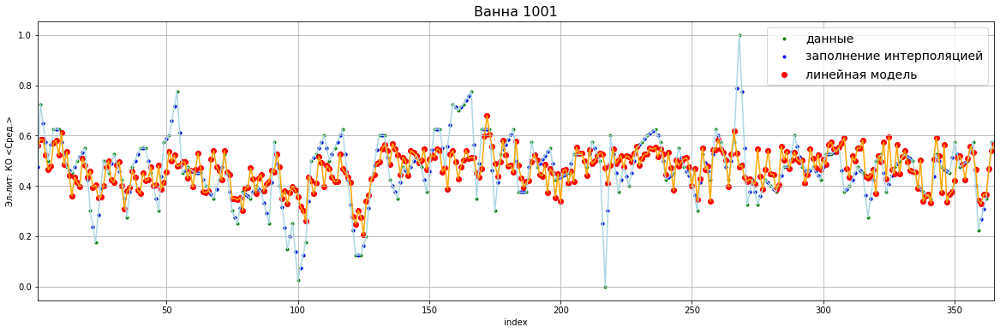

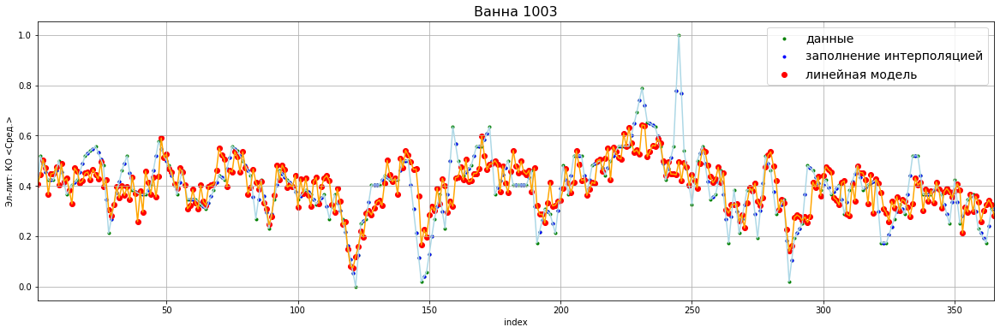

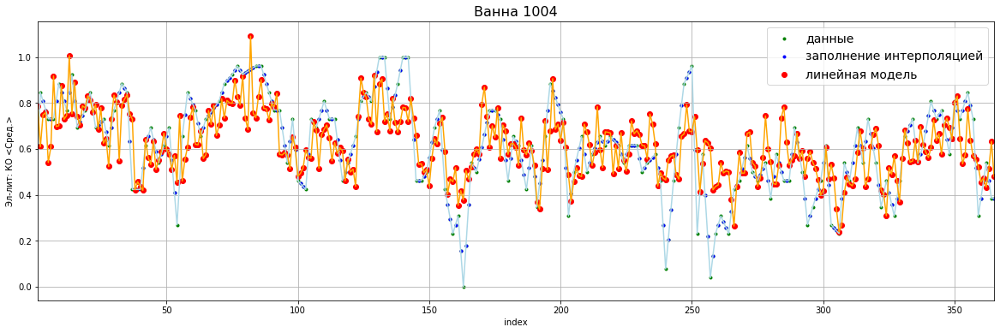

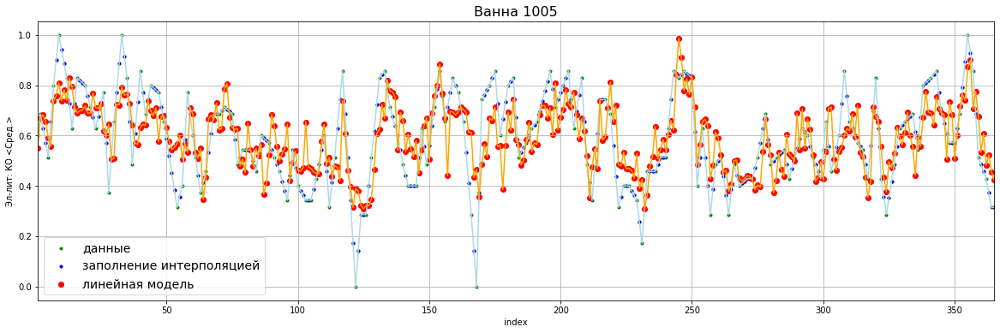

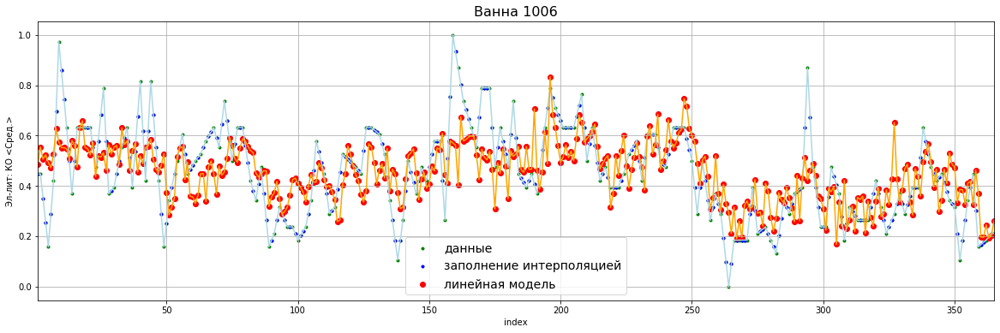

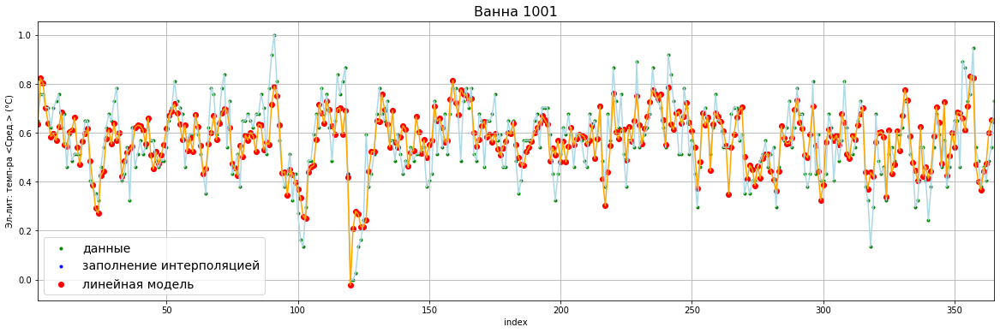

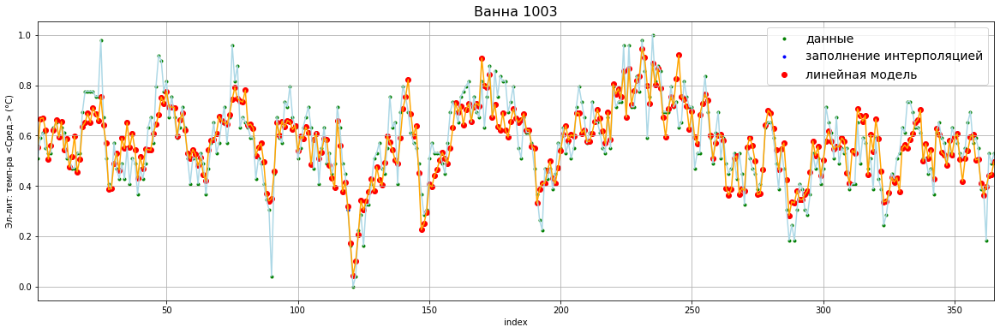

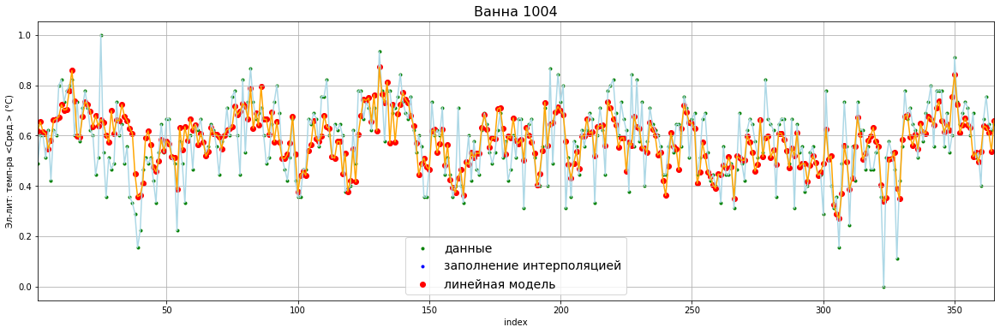

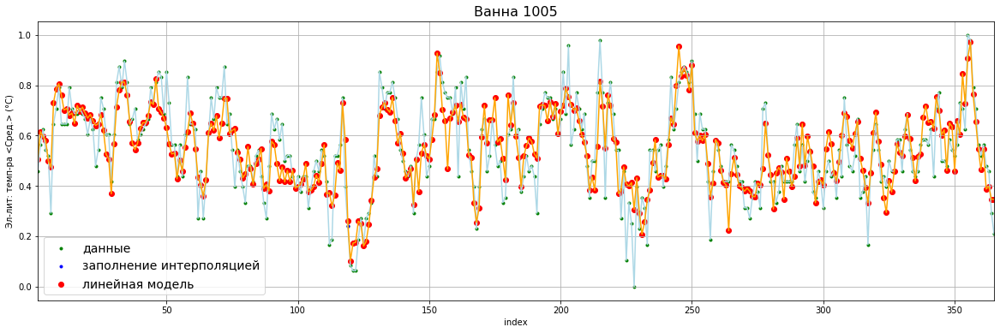

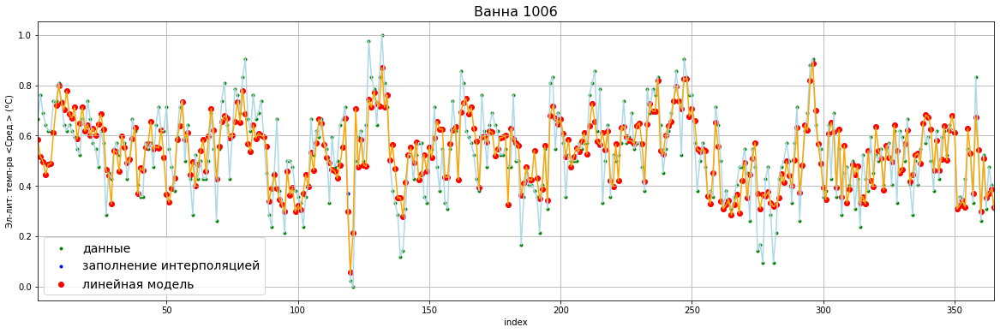

In [15]:
# plot all data and linear regression with interpolation
for i in range(5):
    fig, ax = plt.subplots(figsize=(20,6))
    
    x1=dataScImpInterpolate[i]['EKO'].index+1
    y1=dataScImpInterpolate[i]['EKO'].values
    ax.scatter(x1, y1, color='green', marker='.', label='данные')
    
    x2=dataScaled[i]['EKO'][dataScaled[i]['EKO'].isna()].index+1
    y2=dataScImpInterpolate[i]['EKO'][dataScaled[i]['EKO'].isna()].values
    ax.scatter(x2, y2, color='blue', marker='.', label='заполнение интерполяцией')    

    x3=dataScImpInterpolate[i]['EKO'].index+1
    y3=predictedImpInterpEKO[i]
    ax.scatter(x3, y3, color='red', marker='o', label='линейная модель')    

    ax.plot(x1, y1, color='lightblue')
    ax.plot(x3, y3, color='orange')
    ax.set_xlabel('index')
    ax.set_ylabel(fullNamesInRussian[paramNames.index('EKO')])
    ax.grid(axis = 'both')
    ax.set_xlim(1,365)
    ax.legend(fontsize=14)
    
    ax.set_title('Ванна '+bathNumber[i], fontsize=16)
    # plt.savefig('path\name.png', dpi=300, bbox_inches='tight')
    plt.show()

for i in range(5):
    fig, ax = plt.subplots(figsize=(20,6))
    
    x1=dataScImpInterpolate[i]['ETEMP'].index+1
    y1=dataScImpInterpolate[i]['ETEMP'].values
    ax.scatter(x1, y1, color='green', marker='.', label='данные')
    
    x2=dataScaled[i]['ETEMP'][dataScaled[i]['ETEMP'].isna()].index+1
    y2=dataScImpInterpolate[i]['ETEMP'][dataScaled[i]['ETEMP'].isna()].values
    ax.scatter(x2, y2, color='blue', marker='.', label='заполнение интерполяцией')    

    x3=dataScImpInterpolate[i]['ETEMP'].index+1
    y3=predictedImpInterpETEMP[i]
    ax.scatter(x3, y3, color='red', marker='o', label='линейная модель')    

    ax.plot(x1, y1, color='lightblue')
    ax.plot(x3, y3, color='orange')
    ax.set_xlabel('index')
    ax.set_ylabel(fullNamesInRussian[paramNames.index('ETEMP')])
    ax.grid(axis = 'both')
    ax.set_xlim(1,365)
    ax.legend(fontsize=14)
    
    ax.set_title('Ванна '+bathNumber[i], fontsize=16)
    # plt.savefig('path\name.png', dpi=300, bbox_inches='tight')
    plt.show()


In [16]:
# reverse scaling
rawEKO=[None]*5
rawPredictMeanEKO=[None]*5
rawPredictInterpEKO=[None]*5
for i in range(5):
    rawEKO[i]=data[i]['EKO'].values.reshape(-1, 1)
    scaler = preprocessing.MinMaxScaler()
    scaler.fit(rawEKO[i])
    rawPredictMeanEKO[i] = scaler.inverse_transform(predictedImpMeanEKO[i].reshape(-1, 1))
    rawPredictInterpEKO[i] = scaler.inverse_transform(predictedImpInterpEKO[i].reshape(-1, 1))

# reverse scaling
rawETEMP=[None]*5
rawPredictMeanETEMP=[None]*5
rawPredictInterpETEMP=[None]*5
for i in range(5):
    rawETEMP[i]=data[i]['ETEMP'].values.reshape(-1, 1)
    scaler = preprocessing.MinMaxScaler()
    scaler.fit(rawETEMP[i])
    rawPredictMeanETEMP[i] = scaler.inverse_transform(predictedImpMeanETEMP[i].reshape(-1, 1))
    rawPredictInterpETEMP[i] = scaler.inverse_transform(predictedImpInterpETEMP[i].reshape(-1, 1))    


In [17]:
dataframeEKO=[None]*5
for i in range(5):
    dataframeEKO[i]=pd.DataFrame(
        {
            'raw EKO': rawEKO[i].reshape(1,-1)[0],
            'predicted mean': rawPredictMeanEKO[i].reshape(1,-1)[0],
            'predicted interp': rawPredictInterpEKO[i].reshape(1,-1)[0]
        })

dataframeETEMP=[None]*5
for i in range(5):
    dataframeETEMP[i]=pd.DataFrame(
        {
            'raw ETEMP': rawETEMP[i].reshape(1,-1)[0],
            'predicted mean': rawPredictMeanETEMP[i].reshape(1,-1)[0],
            'predicted interp': rawPredictInterpETEMP[i].reshape(1,-1)[0]
        })


In [18]:
# сохраним в excel
# writer = pd.ExcelWriter('report_v2\\predictedEKOlinearModel.xlsx', engine='xlsxwriter')
# for i in range(5):
#     dataframeEKO[i].to_excel(writer, sheet_name=bathNumber[i])
# writer.save()

# writer = pd.ExcelWriter('report_v2\\predictedETEMPlinearModel.xlsx', engine='xlsxwriter')
# for i in range(5):
#     dataframeETEMP[i].to_excel(writer, sheet_name=bathNumber[i])
# writer.save()
